In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
%matplotlib inline

In [2]:
brain_df = pd.read_csv(r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\data_mask.csv')

In [3]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [4]:
brain_df.head(50)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
5,TCGA_CS_5395_19981004,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1.tif,TCGA_CS_5393_19990606/TCGA_CS_5393_19990606_1_...,0
6,TCGA_CS_5395_19981004,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1.tif,TCGA_CS_4942_19970222/TCGA_CS_4942_19970222_1_...,0
7,TCGA_CS_5395_19981004,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1.tif,TCGA_CS_5397_20010315/TCGA_CS_5397_20010315_1_...,0
8,TCGA_CS_5395_19981004,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1.tif,TCGA_CS_6188_20010812/TCGA_CS_6188_20010812_1_...,0
9,TCGA_CS_5395_19981004,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1.tif,TCGA_CS_6666_20011109/TCGA_CS_6666_20011109_1_...,0


In [5]:
brain_df.mask_path[1]

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [6]:
brain_df.image_path[1]

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [7]:
brain_df['mask'].value_counts()

mask
0    2556
1    1373
Name: count, dtype: int64

In [8]:
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [9]:
brain_df['mask'].value_counts().index

Index([0, 1], dtype='int64', name='mask')

In [10]:
import plotly.graph_objects as go

fig = go.Figure([go.Bar(x = brain_df['mask'].value_counts().index, y = brain_df['mask'].value_counts())])
fig.update_traces(marker_color = 'rgb(0,200,0)', marker_line_color = 'rgb(0,255,0)',
                  marker_line_width = 7, opacity = 0.6)
fig.show()

In [11]:
brain_df.mask_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: mask_path, Length: 3929, dtype: object

In [12]:
brain_df.image_path

0       TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1       TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2       TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3       TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4       TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
                              ...                        
3924    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927    TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...
3928    TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_88...
Name: image_path, Length: 3929, dtype: object

In [13]:
import os

base_dir = r"C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m"

brain_df['image_path'] = brain_df['image_path'].apply(lambda x: os.path.join(base_dir, x))
brain_df['mask_path'] = brain_df['mask_path'].apply(lambda x: os.path.join(base_dir, x))


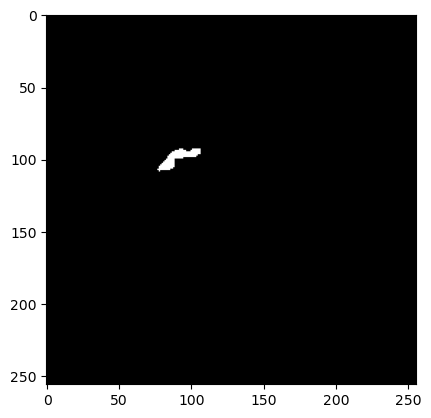

In [14]:
plt.imshow(cv2.imread(brain_df.mask_path[623]))


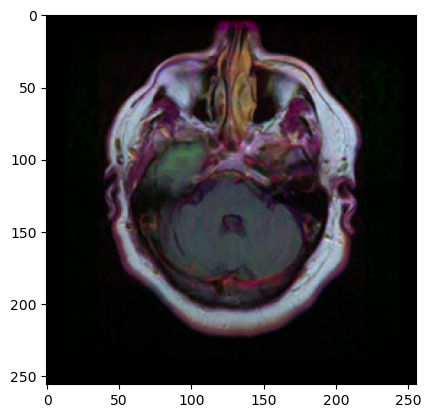

In [15]:

plt.imshow(cv2.imread(brain_df.image_path[623]))

In [16]:
cv2.imread(brain_df.mask_path[623]).min()

0

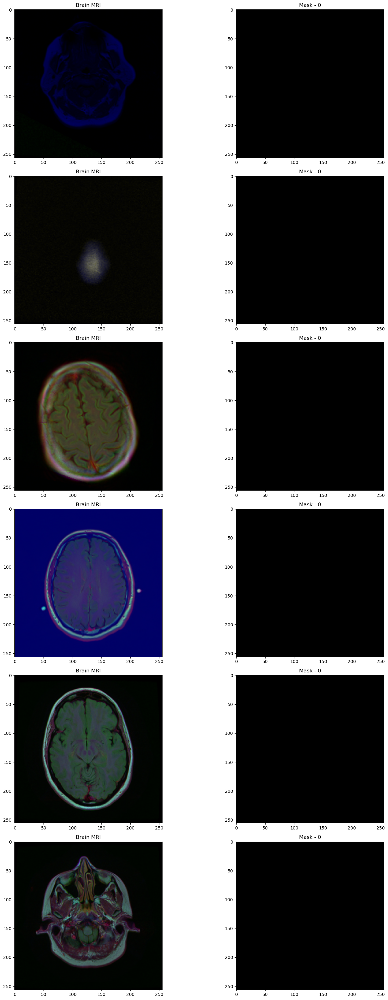

In [17]:
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

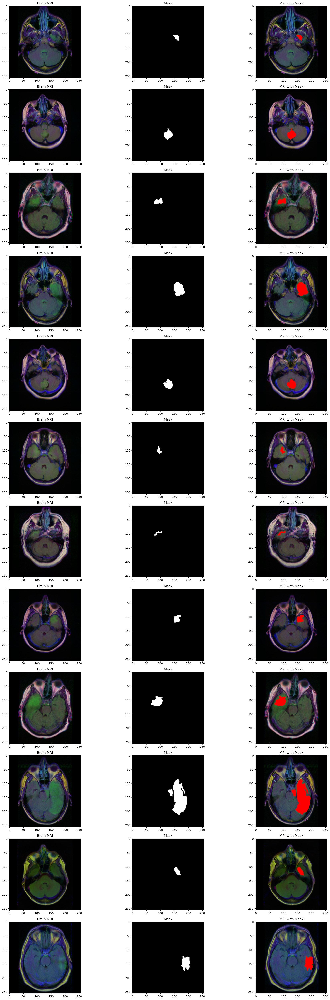

In [18]:
count = 0
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
    img = io.imread(brain_df.image_path[i])
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')
    img[mask == 255] = (255,0,0)
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

In [19]:
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [20]:
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [21]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [22]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.15)

In [23]:
!pip install keras_preprocessing

In [24]:
from keras_preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)


In [25]:
train_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="training",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))


valid_generator=datagen.flow_from_dataframe(
dataframe=train,
directory= './',
x_col='image_path',
y_col='mask',
subset="validation",
batch_size=16,
shuffle=True,
class_mode="categorical",
target_size=(256,256))

# Create a data generator for test images
test_datagen=ImageDataGenerator(rescale=1./255.)

test_generator=test_datagen.flow_from_dataframe(
dataframe=test,
directory= './',
x_col='image_path',
y_col='mask',
batch_size=16,
shuffle=False,
class_mode='categorical',
target_size=(256,256))



Found 2839 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.
Found 590 validated image filenames belonging to 2 classes.


In [26]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the CNN model
def build_cnn(input_shape=(256, 256, 3), num_classes=2):
    model = Sequential([
        # Convolutional layers
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        # Flattening
        Flatten(),

        # Fully connected layers
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Initialize the model
model = build_cnn(input_shape=(256, 256, 3), num_classes=2)

# Set up callbacks
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
checkpoint = ModelCheckpoint(
    filepath=r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model.keras', 
    save_best_only=True, 
    monitor='val_loss', 
    mode='min',
    verbose=1
)

# Train the model
history = model.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=10,
    callbacks=[earlystopping, checkpoint]
)

# Load the best model after training
model = tf.keras.models.load_model(r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model.keras')


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/10


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.6819 - loss: 0.6278
Epoch 1: val_loss improved from inf to 0.45449, saving model to C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model.keras
178/178 ━━━━━━━━━━━━━━━━━━━━ 480s 3s/step - accuracy: 0.6821 - loss: 0.6274 - val_accuracy: 0.7660 - val_loss: 0.4545
Epoch 2/10
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7734 - loss: 0.4510
Epoch 2: val_loss improved from 0.45449 to 0.45341, saving model to C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model.keras
178/178 ━━━━━━━━━━━━━━━━━━━━ 570s 3s/step - accuracy: 0.7734 - loss: 0.4511 - val_accuracy: 0.7500 - val_loss: 0.4534
Epoch 3/10
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7753 - loss: 0.4386
Epoch 3: val_loss improved from 0.45341 to 0.44056, saving model to C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model.keras
178/178 ━━━━━━━━━━━━━━━━━━━━ 514s 3s/step - accuracy: 0.7753 - loss: 0.4386 - val_accuracy: 0.7600 - val_loss: 0.440

In [27]:
# Save the trained model
model_save_path = r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\brain_tumor_cnn_model.keras'
model.save(model_save_path)

print(f"Model saved successfully at: {model_save_path}")


Model saved successfully at: C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\brain_tumor_cnn_model.keras


In [28]:
from tensorflow.keras.models import load_model

# Load the saved model
loaded_model = load_model(model_save_path)
print("Model loaded successfully!")


Model loaded successfully!


In [29]:
# make prediction

test_predict = loaded_model.predict(test_generator, steps = test_generator.n // 16, verbose =1)

36/36 ━━━━━━━━━━━━━━━━━━━━ 22s 586ms/step


In [30]:
test_predict

array([[0.87087524, 0.12912482],
       [0.00275064, 0.9972493 ],
       [0.78942585, 0.21057414],
       ...,
       [0.271998  , 0.72800195],
       [0.9988796 , 0.00112041],
       [0.97525907, 0.02474094]], dtype=float32)

In [31]:
predict = []

for i in test_predict:
  predict.append(str(np.argmax(i)))

predict = np.asarray(predict)

In [32]:
predict


array(['0', '1', '0', '1', '1', '0', '1', '0', '0', '1', '1', '0', '0',
       '0', '0', '1', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0',
       '0', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '1',
       '0', '1', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0',
       '0', '0', '1', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '1', '0', '0', '1', '0', '1', '0', '0', '0', '0',
       '1', '1', '1', '1', '0', '1', '0', '0', '0', '1', '0', '1', '0',
       '1', '0', '0', '0', '0', '1', '1', '0', '0', '1', '1', '0', '0',
       '1', '0', '0', '0', '0', '1', '1', '0', '0', '1', '0', '0', '0',
       '0', '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '1', '0', '1', '0', '1', '0', '0', '1', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '1', '0', '1', '1', '1', '0', '1',
       '0', '1', '0', '1', '0', '1', '0', '0', '1', '0', '0', '0

In [33]:
original = np.asarray(test['mask'])[:len(predict)]
len(original)

576

In [34]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(original, predict)
accuracy

0.9010416666666666

<Axes: >

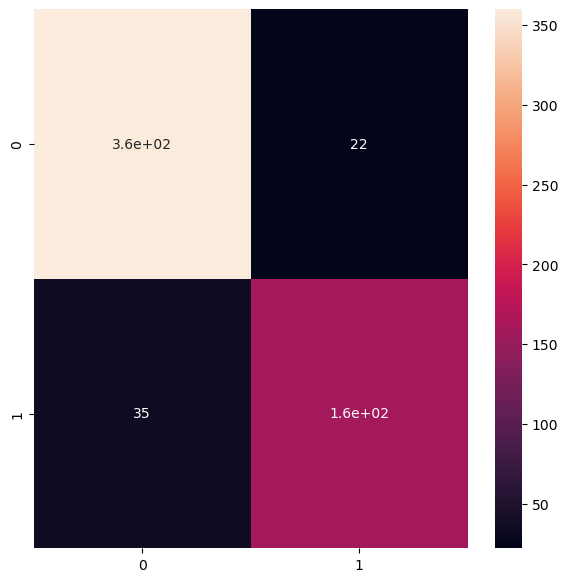

In [35]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(original, predict)
plt.figure(figsize = (7,7))
sns.heatmap(cm, annot=True)

In [36]:
from sklearn.metrics import classification_report

report = classification_report(original, predict, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.91      0.94      0.93       382
           1       0.88      0.82      0.85       194

   micro avg       0.90      0.90      0.90       576
   macro avg       0.89      0.88      0.89       576
weighted avg       0.90      0.90      0.90       576



C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [37]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Define the CNN model
def build_cnn2(input_shape=(256, 256, 3), num_classes=2):
    model = Sequential([
        # Convolutional layers
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        Conv2D(256, (3, 3), activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),

        # Flattening
        Flatten(),

        # Fully connected layers
        Dense(512, activation='relu'),
        Dropout(0.5),
        Dense(num_classes, activation='softmax')
    ])
    
    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Initialize the model
model2 = build_cnn2(input_shape=(256, 256, 3), num_classes=2)

# Set up callbacks
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
checkpoint = ModelCheckpoint(
    filepath=r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model2.keras', 
    save_best_only=True, 
    monitor='val_loss', 
    mode='min',
    verbose=1
)

# Train the model
history = model2.fit(
    train_generator,
    validation_data=valid_generator,
    epochs=20,
    callbacks=[earlystopping, checkpoint]
)

# Load the best model after training
model2 = tf.keras.models.load_model(r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model2.keras')


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/20
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7006 - loss: 0.5865
Epoch 1: val_loss improved from inf to 0.43500, saving model to C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model2.keras
178/178 ━━━━━━━━━━━━━━━━━━━━ 444s 2s/step - accuracy: 0.7008 - loss: 0.5861 - val_accuracy: 0.7940 - val_loss: 0.4350
Epoch 2/20
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.7938 - loss: 0.4280
Epoch 2: val_loss did not improve from 0.43500
178/178 ━━━━━━━━━━━━━━━━━━━━ 388s 2s/step - accuracy: 0.7938 - loss: 0.4279 - val_accuracy: 0.7860 - val_loss: 0.4743
Epoch 3/20
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8033 - loss: 0.3895
Epoch 3: val_loss improved from 0.43500 to 0.35601, saving model to C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\best_model2.keras
178/178 ━━━━━━━━━━━━━━━━━━━━ 485s 3s/step - accuracy: 0.8033 - loss: 0.3895 - val_accuracy: 0.8400 - val_loss: 0.3560
Epoch 4/20
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8482 - lo

In [38]:
model_save_path2 = r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\brain_tumor_cnn_model2.keras'
model.save(model_save_path2)

print(f"Model saved successfully at: {model_save_path2}")

Model saved successfully at: C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\brain_tumor_cnn_model2.keras


In [76]:
from tensorflow.keras.models import load_model

# Load the saved model
model_save_path2 = r'C:\Users\DELL\OneDrive\Desktop\brain_mri\kaggle_3m\brain_tumor_cnn_model2.keras'
loaded_model2 = load_model(model_save_path2)

# Check if the model loaded successfully
print("Model loaded successfully!")


Model loaded successfully!


In [77]:
test_loss, test_acc = loaded_model2.evaluate(test_generator)
print(f"Test Loss: {test_loss}, Test Accuracy: {test_acc}")


37/37 ━━━━━━━━━━━━━━━━━━━━ 18s 454ms/step - accuracy: 0.9021 - loss: 0.2212
Test Loss: 0.2207573801279068, Test Accuracy: 0.9016948938369751


In [78]:
import numpy as np

predict2 = []

# Assuming test_predict2 is the output of the model's prediction on the test set
for i in test_predict2:
    predict2.append(str(np.argmax(i)))  # Get the predicted class (index of max value)

# Convert list to numpy array
predict2 = np.asarray(predict2)

print(predict2)


['0' '1' '0' '1' '1' '0' '1' '0' '0' '1' '1' '0' '0' '0' '0' '1' '1' '0'
 '0' '0' '0' '1' '0' '0' '0' '0' '1' '0' '0' '0' '0' '0' '1' '0' '0' '1'
 '0' '0' '0' '0' '0' '1' '0' '0' '0' '0' '1' '0' '0' '0' '0' '1' '0' '1'
 '0' '0' '0' '0' '1' '1' '0' '0' '0' '0' '0' '0' '0' '1' '0' '1' '1' '0'
 '0' '0' '0' '0' '0' '0' '1' '0' '0' '1' '0' '0' '1' '0' '1' '0' '0' '0'
 '0' '1' '1' '1' '1' '0' '1' '0' '0' '0' '1' '0' '1' '0' '1' '0' '0' '0'
 '0' '1' '1' '0' '0' '1' '1' '0' '0' '1' '0' '0' '0' '0' '1' '1' '0' '0'
 '1' '0' '0' '0' '0' '1' '0' '1' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '1' '0' '1' '0' '1' '0' '0' '1' '0' '0' '0' '0' '1' '0' '0' '0' '0' '0'
 '1' '0' '1' '1' '1' '0' '1' '0' '1' '0' '1' '0' '1' '0' '0' '1' '0' '0'
 '0' '1' '1' '0' '0' '1' '1' '0' '1' '0' '0' '0' '0' '1' '0' '1' '0' '0'
 '0' '1' '1' '1' '0' '1' '1' '0' '0' '0' '0' '1' '0' '0' '1' '0' '0' '0'
 '0' '0' '0' '0' '1' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '1'
 '1' '0' '0' '0' '1' '0' '0' '1' '0' '0' '1' '0' '1

In [53]:
predict2

array(['0', '1', '0', '1', '1', '0', '1', '0', '0', '1', '1', '0', '0',
       '0', '0', '1', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '1', '0', '0', '1', '0', '0', '0',
       '0', '0', '1', '0', '0', '0', '0', '1', '0', '0', '0', '0', '1',
       '0', '1', '0', '0', '0', '0', '1', '1', '0', '0', '0', '0', '0',
       '0', '0', '1', '0', '1', '1', '0', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '1', '0', '0', '1', '0', '1', '0', '0', '0', '0',
       '1', '1', '1', '1', '0', '1', '0', '0', '0', '1', '0', '1', '0',
       '1', '0', '0', '0', '0', '1', '1', '0', '0', '1', '1', '0', '0',
       '1', '0', '0', '0', '0', '1', '1', '0', '0', '1', '0', '0', '0',
       '0', '1', '0', '1', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '1', '0', '1', '0', '1', '0', '0', '1', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '1', '0', '1', '1', '1', '0', '1',
       '0', '1', '0', '1', '0', '1', '0', '0', '1', '0', '0', '0

In [79]:
# Assuming 'test' DataFrame has a 'mask' column with true labels
original2 = np.asarray(test['mask'])[:len(predict2)]

# Check the length of the original labels
print(len(original2))


576


In [80]:
from sklearn.metrics import accuracy_score

# Calculate the accuracy of predictions
accuracy2 = accuracy_score(original2, predict2)

# Print the accuracy
print(f"Accuracy: {accuracy2}")


Accuracy: 0.9010416666666666


In [81]:
from sklearn.metrics import classification_report

# Generate the classification report
report2 = classification_report(original2, predict2, labels=[0, 1])

# Print the report
print(report2)


              precision    recall  f1-score   support

           0       0.91      0.94      0.93       382
           1       0.88      0.82      0.85       194

   micro avg       0.90      0.90      0.90       576
   macro avg       0.89      0.88      0.89       576
weighted avg       0.90      0.90      0.90       576



C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison

C:\ProgramData\anaconda3\Lib\site-packages\numpy\lib\arraysetops.py:729: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


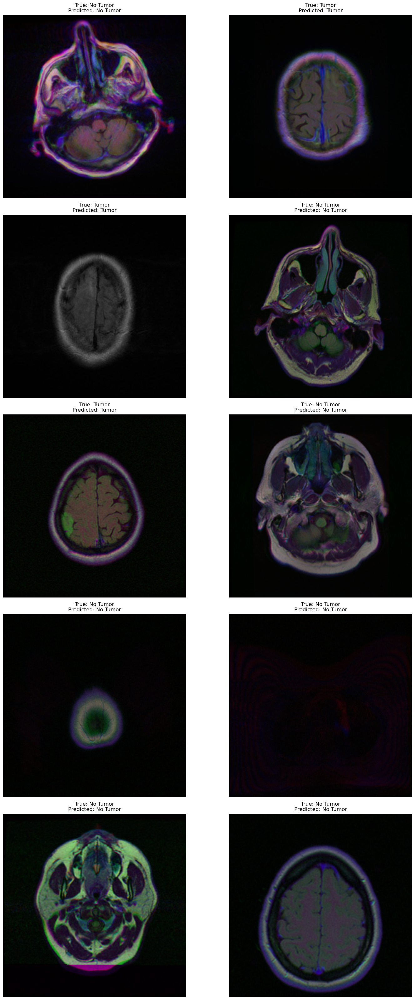

In [85]:
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.preprocessing import image

# Function to preprocess and predict the image
def predict_image(model, img_path):
    # Load the image and preprocess it
    img = image.load_img(img_path, target_size=(256, 256))  # Resize to match input shape
    img_array = image.img_to_array(img)  # Convert image to array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Rescale the image

    # Predict the class
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions, axis=1)[0]  # Get the class index
    return predicted_class, predictions

# Generate predictions and display 10 random images from the dataset
fig, axs = plt.subplots(5, 2, figsize=(16, 32))  # Create a grid for 10 images
axs = axs.flatten()  # Flatten the grid for easier indexing

for idx in range(10):  # Display 10 images
    i = random.randint(0, len(brain_df) - 1)  # Randomly select an image index
    img_path = brain_df['image_path'][i]  # Get the path of the image
    mask_label = brain_df['mask'][i]  # Get the actual label

    # Predict the class of the image
    predicted_class, predictions = predict_image(loaded_model2, img_path)

    # Load and preprocess the image for display
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    # Plot the image
    axs[idx].imshow(img)
    axs[idx].set_title(
        f"True: {'Tumor' if mask_label == 1 else 'No Tumor'}\nPredicted: {'Tumor' if predicted_class == 1 else 'No Tumor'}",
        fontsize=12,
    )
    axs[idx].axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()
